# KNN DATASET 1-Water quality Classification Exercise



In [3]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np

In [4]:
import os

In [5]:
path=r'C:\Users\ANIL\Desktop\python\DATASETS'
os.chdir(path)

In [6]:
df=pd.read_csv('waterQuality1.csv')
df

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.040,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.010,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.040,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.040,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.030,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2.47,28.50,0.001,3.67,0.002,3.63,0.63,1.47,1.37,0.31,...,0.197,13.53,1.09,0.005,11.55,2.13,0.09,0.05,0.03,1
996,2.26,27.01,0.010,3.84,0.006,5.22,0.79,1.97,1.48,0.34,...,0.031,9.52,1.43,0.001,16.06,1.11,0.09,0.14,0.08,1
997,4.33,25.49,0.001,1.74,0.002,2.46,0.34,0.71,0.91,0.66,...,0.182,15.37,1.90,0.006,5.61,4.84,0.08,0.05,0.05,1
998,4.93,8.36,0.010,0.38,0.002,3.13,0.57,1.18,0.03,0.28,...,0.069,0.46,1.65,0.004,56.99,1.73,0.05,0.43,0.04,0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    1000 non-null   float64
 1   ammonia      1000 non-null   float64
 2   arsenic      1000 non-null   float64
 3   barium       1000 non-null   float64
 4   cadmium      1000 non-null   float64
 5   chloramine   1000 non-null   float64
 6   chromium     1000 non-null   float64
 7   copper       1000 non-null   float64
 8   flouride     1000 non-null   float64
 9   bacteria     1000 non-null   float64
 10  viruses      1000 non-null   float64
 11  lead         1000 non-null   float64
 12  nitrates     1000 non-null   float64
 13  nitrites     1000 non-null   float64
 14  mercury      1000 non-null   float64
 15  perchlorate  1000 non-null   float64
 16  radium       1000 non-null   float64
 17  selenium     1000 non-null   float64
 18  silver       1000 non-null   float64
 19  uranium

In [8]:
df.shape

(1000, 21)

In [9]:
df.describe()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,2.446280,15.485030,0.025030,2.042160,0.004488,4.070580,0.443880,1.029920,0.771510,0.502910,...,0.103221,9.56723,1.489360,0.005195,29.441210,4.042680,0.04970,0.246640,0.044680,0.651000
std,1.433042,8.719787,0.014742,1.134923,0.002547,2.252979,0.261701,0.580523,0.435526,0.282662,...,0.056014,5.53147,0.280884,0.002967,16.509726,2.273725,0.02877,0.144351,0.026915,0.476892
min,0.000000,0.020000,0.001000,0.010000,0.001000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.002000,0.01000,1.000000,0.000000,0.070000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,1.147500,8.235000,0.010000,1.040000,0.002000,2.160000,0.210000,0.540000,0.407500,0.260000,...,0.054000,4.82000,1.250000,0.003000,15.465000,2.130000,0.02750,0.120000,0.020000,0.000000
50%,2.505000,15.735000,0.030000,2.030000,0.004000,4.130000,0.440000,1.050000,0.765000,0.510000,...,0.105000,9.67000,1.480000,0.005000,29.390000,4.110000,0.05000,0.240000,0.050000,1.000000
75%,3.670000,23.182500,0.040000,3.010000,0.007000,6.070000,0.670000,1.530000,1.160000,0.740000,...,0.152000,14.35500,1.730000,0.008000,43.632500,5.962500,0.07000,0.370000,0.070000,1.000000
max,5.000000,29.840000,0.050000,4.000000,0.009000,7.990000,0.900000,2.000000,1.500000,1.000000,...,0.200000,18.99000,2.000000,0.010000,59.740000,7.990000,0.10000,0.500000,0.090000,1.000000


In [10]:
df.head()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1


In [12]:
df.isnull().sum()

aluminium      0
ammonia        0
arsenic        0
barium         0
cadmium        0
chloramine     0
chromium       0
copper         0
flouride       0
bacteria       0
viruses        0
lead           0
nitrates       0
nitrites       0
mercury        0
perchlorate    0
radium         0
selenium       0
silver         0
uranium        0
is_safe        0
dtype: int64

# Visualization part

In [13]:
df['is_safe'].unique()

array([1, 0], dtype=int64)

array([[<AxesSubplot:title={'center':'aluminium'}>,
        <AxesSubplot:title={'center':'ammonia'}>,
        <AxesSubplot:title={'center':'arsenic'}>,
        <AxesSubplot:title={'center':'barium'}>,
        <AxesSubplot:title={'center':'cadmium'}>],
       [<AxesSubplot:title={'center':'chloramine'}>,
        <AxesSubplot:title={'center':'chromium'}>,
        <AxesSubplot:title={'center':'copper'}>,
        <AxesSubplot:title={'center':'flouride'}>,
        <AxesSubplot:title={'center':'bacteria'}>],
       [<AxesSubplot:title={'center':'viruses'}>,
        <AxesSubplot:title={'center':'lead'}>,
        <AxesSubplot:title={'center':'nitrates'}>,
        <AxesSubplot:title={'center':'nitrites'}>,
        <AxesSubplot:title={'center':'mercury'}>],
       [<AxesSubplot:title={'center':'perchlorate'}>,
        <AxesSubplot:title={'center':'radium'}>,
        <AxesSubplot:title={'center':'selenium'}>,
        <AxesSubplot:title={'center':'silver'}>,
        <AxesSubplot:title={'center':'u

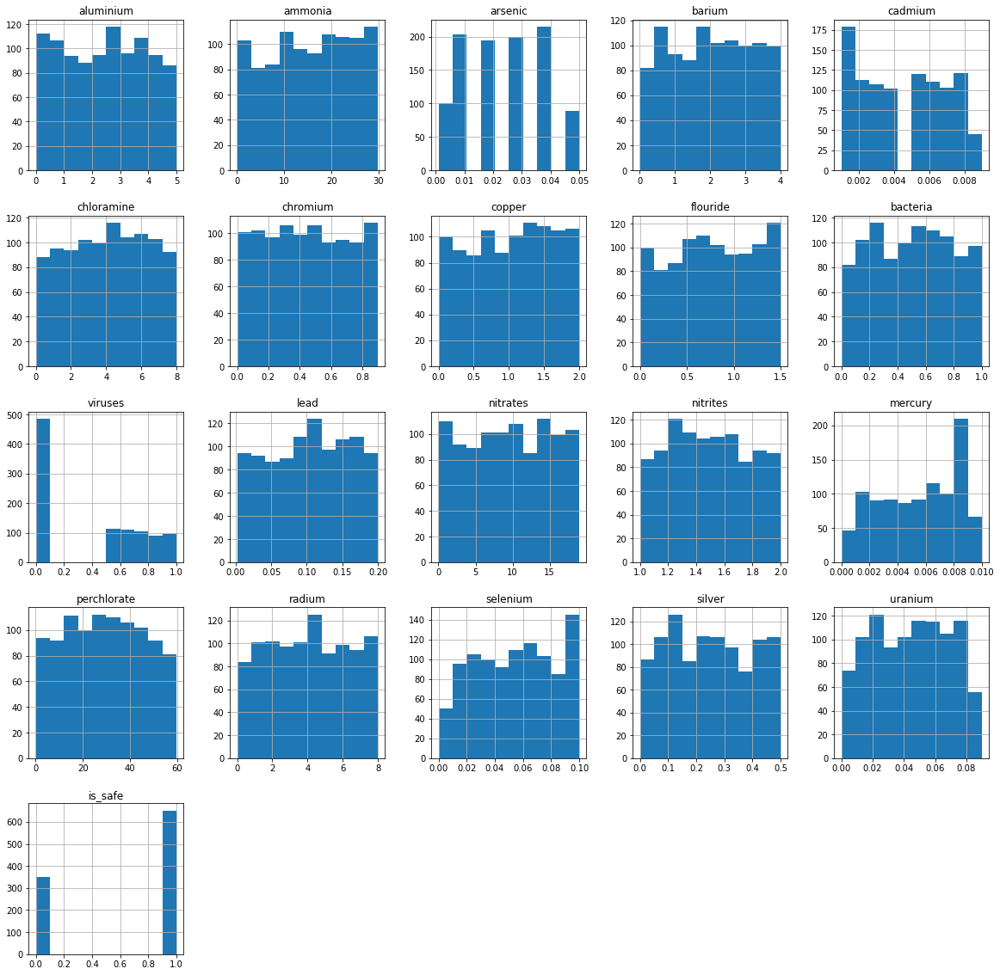

In [16]:
df.hist(figsize=(20,20))

C:\Users\ANIL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ANIL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ANIL\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

IndexError: index 3 is out of bounds for axis 0 with size 3

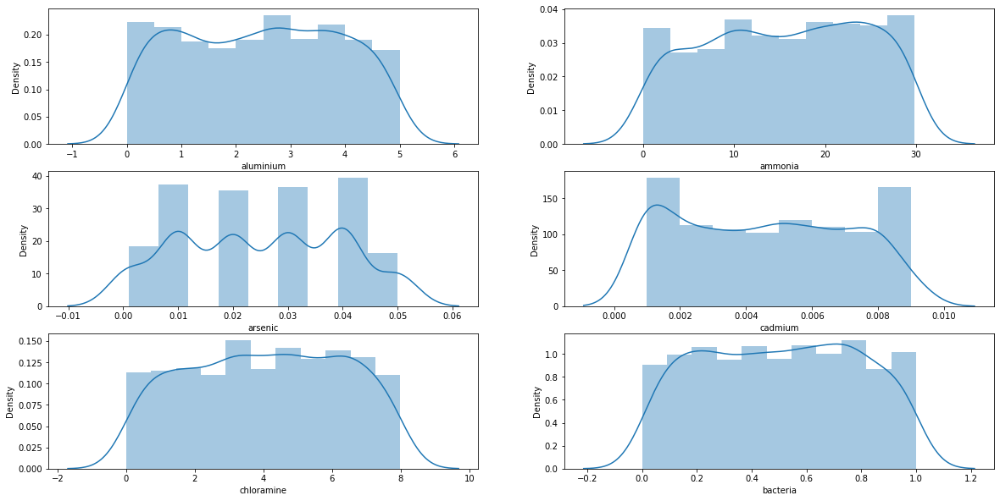

In [22]:
fig, ax = plt.subplots(3, 2)

fig.set_figheight(10)
fig.set_figwidth(20)


sns.distplot(df['aluminium'], ax = ax[0,0])
sns.distplot(df['ammonia'], ax = ax[0,1])
sns.distplot(df['arsenic'], ax = ax[1,0])
sns.distplot(df['cadmium'], ax = ax[1,1])
sns.distplot(df['chloramine'], ax = ax[2,0])
sns.distplot(df['bacteria'], ax = ax[2,1])
sns.distplot(df['viruses'], ax = ax[3,0])
sns.distplot(df['lead'], ax = ax[3,1])


ax[0,0].set_title('aluminium')
ax[0,1].set_title('ammonia')
ax[1,0].set_title('arsenic')
ax[1,1].set_title('cadmium')
ax[2,0].set_title('chloramine')
ax[2,1].set_title('bacteria')
ax[3,0].set_title('viruses')
ax[3,1].set_title('lead')
plt.show()

In [23]:
df.columns

Index(['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium', 'is_safe'],
      dtype='object')

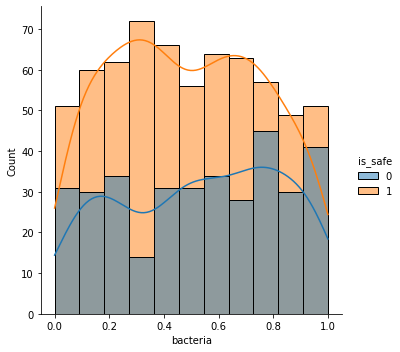

In [24]:
sns.displot(df, x="bacteria", hue="is_safe", kde=True)

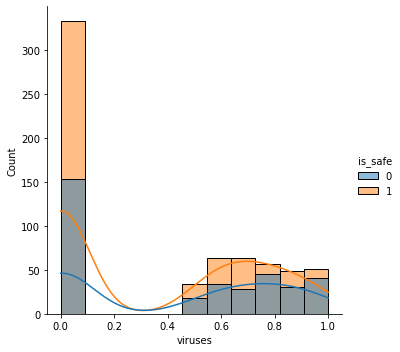

In [31]:
sns.displot(df, x="viruses", hue="is_safe", kde=True)

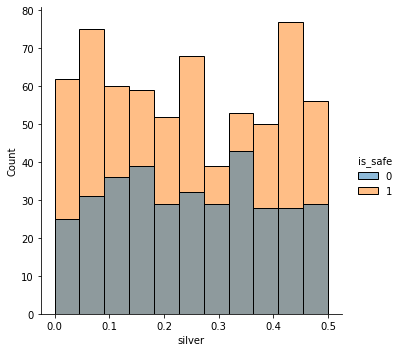

In [28]:
sns.displot(df, x="silver", hue="is_safe", kde=False)

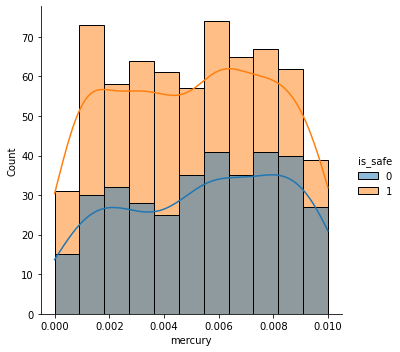

In [30]:
sns.displot(df, x="mercury", hue="is_safe", kde=True)

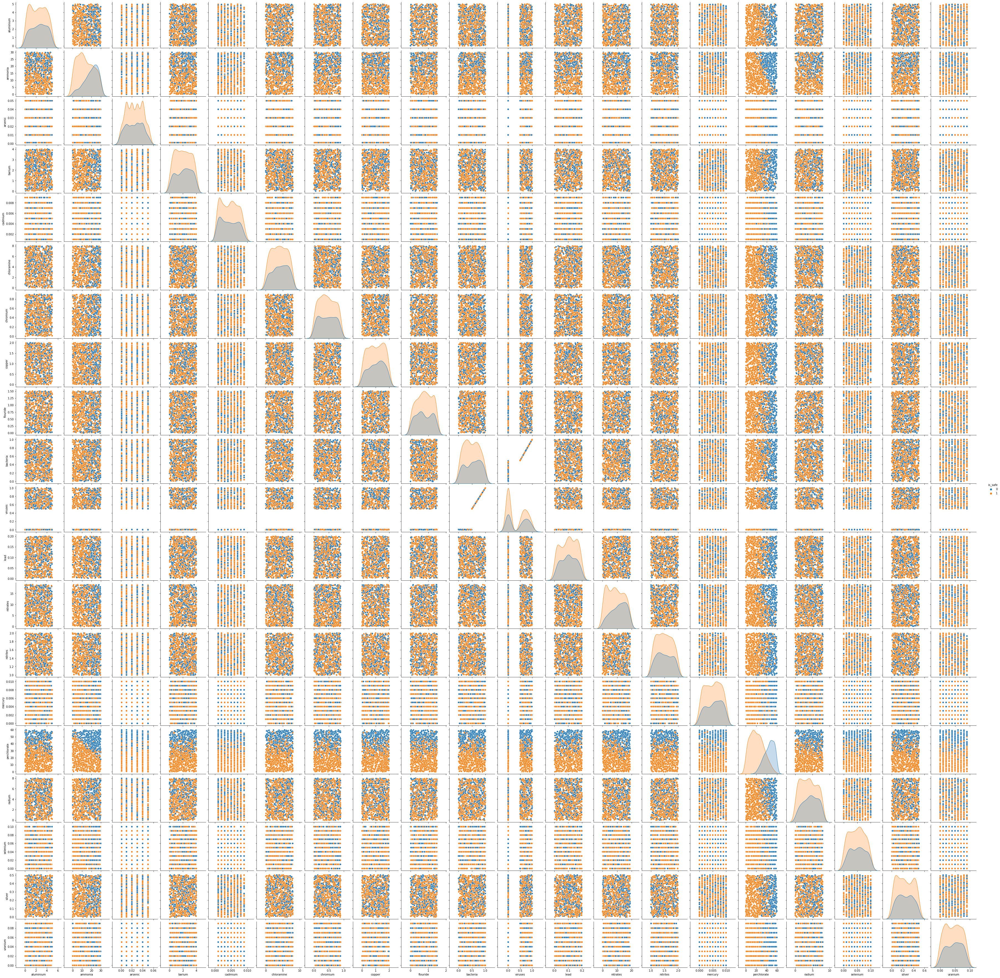

In [40]:
sns.pairplot(df, hue="is_safe")

C:\Users\ANIL\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\ANIL\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\ANIL\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\ANIL\anaconda3\l

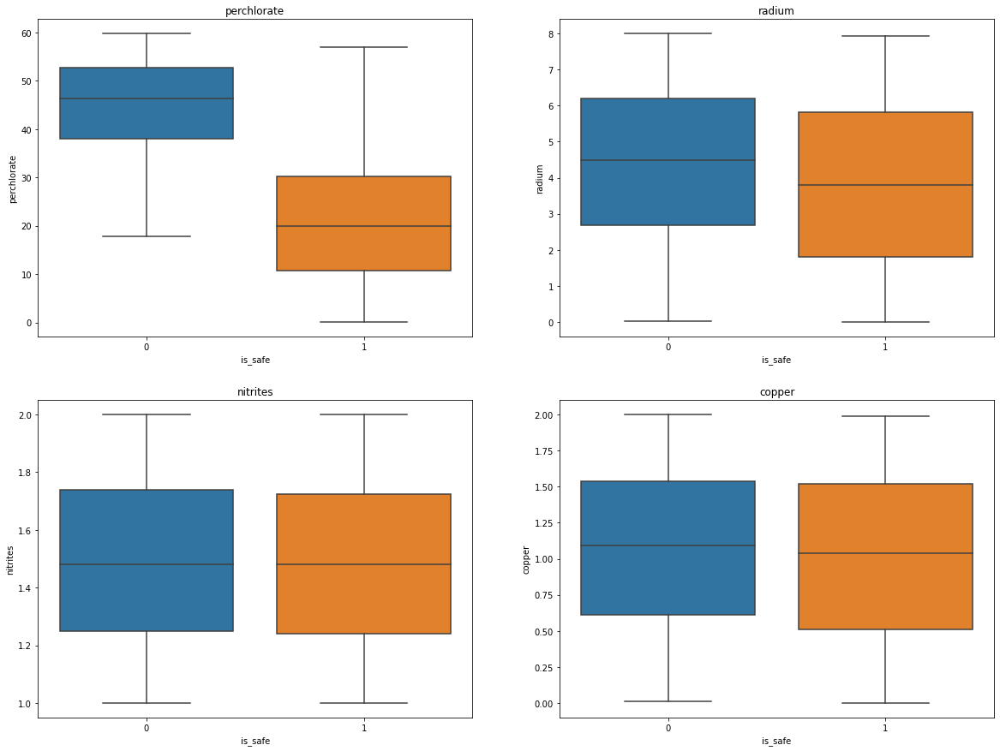

In [42]:
fig, ax = plt.subplots(2, 2)

fig.set_figheight(15)
fig.set_figwidth(20)

sns.boxplot(df['is_safe'], df['perchlorate'], ax = ax[0,0])
sns.boxplot(df['is_safe'], df['radium'], ax = ax[0,1])
sns.boxplot(df['is_safe'], df['nitrites'], ax = ax[1,0])
sns.boxplot(df['is_safe'], df['copper'], ax = ax[1,1])

ax[0,0].set_title('perchlorate')
ax[0,1].set_title('radium')
ax[1,0].set_title('nitrites')
ax[1,1].set_title('copper')
plt.show()

<AxesSubplot:>

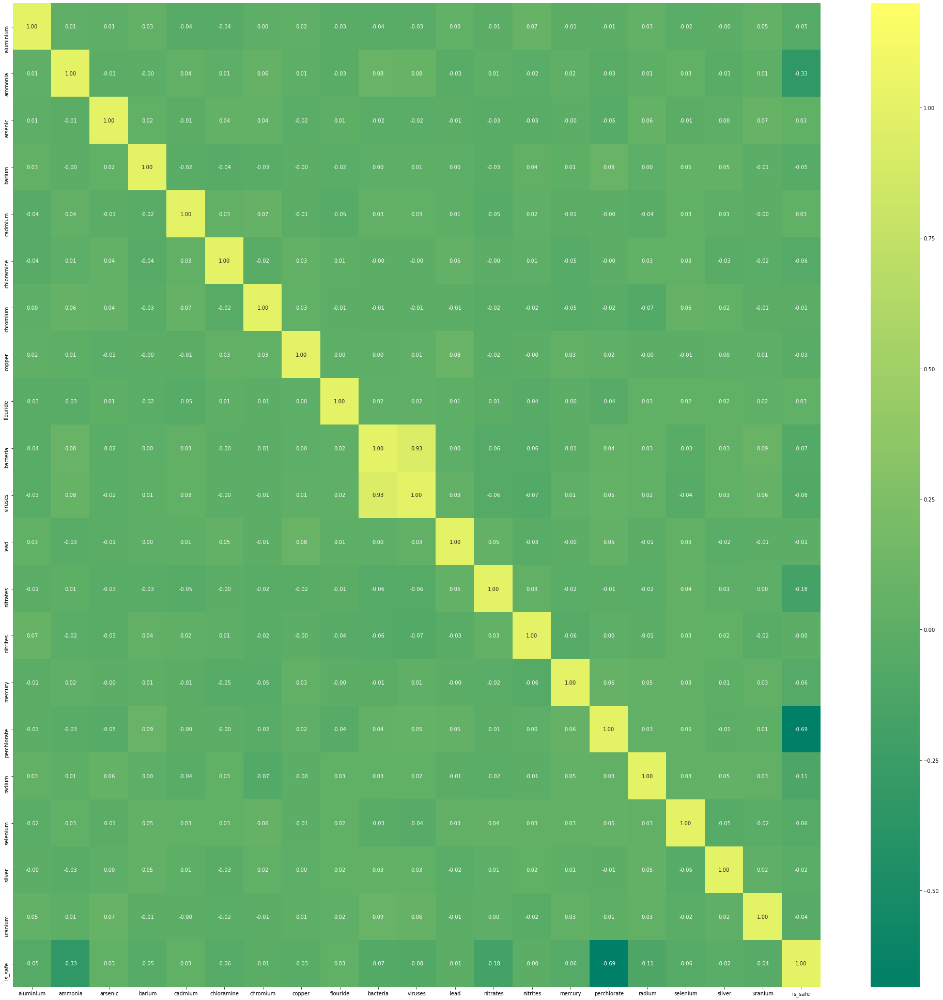

In [49]:
plt.figure(figsize=(35,35)) 
sns.heatmap(df.corr(), vmax=1.2, square=False, annot=True, fmt='.2f', cmap="summer")

In [43]:
df.corr()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
aluminium,1.000000,0.014788,0.005521,0.030747,-0.041750,-0.043018,0.000124,0.020702,-0.034335,-0.035423,...,0.025273,-0.012509,0.073001,-0.013737,-0.007420,0.034567,-0.015855,-0.000532,0.050481,-0.052332
ammonia,0.014788,1.000000,-0.010243,-0.003355,0.035514,0.006754,0.063452,0.010570,-0.028511,0.081705,...,-0.030565,0.010788,-0.021715,0.020067,-0.028776,0.012534,0.028830,-0.026176,0.013349,-0.328034
arsenic,0.005521,-0.010243,1.000000,0.023531,-0.013855,0.042784,0.044323,-0.019743,0.008280,-0.016892,...,-0.012733,-0.028820,-0.029699,-0.003750,-0.046029,0.056545,-0.010623,0.003956,0.066123,0.027405
barium,0.030747,-0.003355,0.023531,1.000000,-0.024853,-0.044197,-0.031467,-0.001538,-0.021515,0.003910,...,0.002163,-0.027511,0.035867,0.011882,0.086142,0.003691,0.047399,0.050540,-0.006754,-0.046896
cadmium,-0.041750,0.035514,-0.013855,-0.024853,1.000000,0.030850,0.065641,-0.010542,-0.047935,0.032454,...,0.013087,-0.050047,0.015493,-0.013269,-0.000600,-0.035284,0.025087,0.009474,-0.000786,0.028279
chloramine,-0.043018,0.006754,0.042784,-0.044197,0.030850,1.000000,-0.023163,0.030781,0.009778,-0.001771,...,0.045193,-0.002315,0.006125,-0.050677,-0.004375,0.027699,0.025494,-0.034646,-0.017383,-0.062298
chromium,0.000124,0.063452,0.044323,-0.031467,0.065641,-0.023163,1.000000,0.025936,-0.007279,-0.014376,...,-0.005222,-0.024739,-0.024854,-0.048807,-0.022562,-0.074023,0.061497,0.022423,-0.013523,-0.011517
copper,0.020702,0.010570,-0.019743,-0.001538,-0.010542,0.030781,0.025936,1.000000,0.002418,0.003147,...,0.082161,-0.024615,-0.002202,0.031981,0.017577,-0.000660,-0.005647,0.004718,0.007782,-0.033474
flouride,-0.034335,-0.028511,0.008280,-0.021515,-0.047935,0.009778,-0.007279,0.002418,1.000000,0.018381,...,0.007569,-0.008026,-0.041020,-0.004458,-0.041263,0.025330,0.022548,0.024161,0.017064,0.026637
bacteria,-0.035423,0.081705,-0.016892,0.003910,0.032454,-0.001771,-0.014376,0.003147,0.018381,1.000000,...,0.001716,-0.060692,-0.062318,-0.011647,0.044385,0.025331,-0.026800,0.033391,0.085810,-0.071024


<AxesSubplot:ylabel='is_safe'>

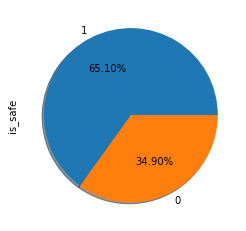

In [44]:
df['is_safe'].value_counts().plot.pie(autopct='%1.2f%%',shadow=True)

# Preprocessiong and rest of the part

In [50]:
print(df.columns)

Index(['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium', 'is_safe'],
      dtype='object')


In [51]:
#Splitting the dataset

X=df[['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium']]
y=df['is_safe']

In [52]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=55)

In [62]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=7)   
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=7)

In [63]:
y_pred=knn.predict(X_test)
y_pred

array([1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0,
       1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1,
       0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1], d

In [64]:
#Measuring the accuracy

from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[103   9]
 [  3 185]]
              precision    recall  f1-score   support

           0       0.97      0.92      0.94       112
           1       0.95      0.98      0.97       188

    accuracy                           0.96       300
   macro avg       0.96      0.95      0.96       300
weighted avg       0.96      0.96      0.96       300



In [56]:
error_rate = []

for i in range(1,20):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

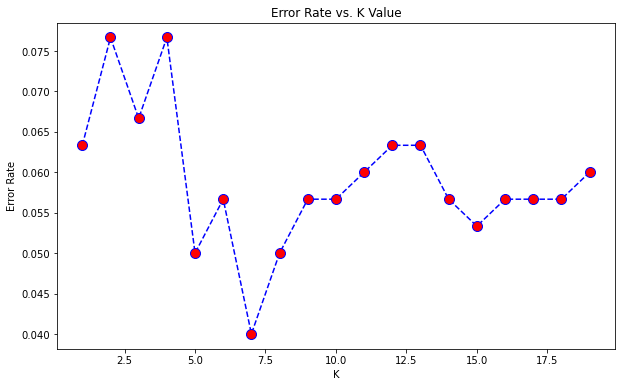

In [57]:
plt.figure(figsize=(10,6))
plt.plot(range(1,20),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')